In [1]:
import os
import json
from shapely.geometry import Polygon
from PIL import Image, ImageDraw
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import MeanIoU
import numpy as np

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
train_images = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/train_images.npy')
train_binary_masks = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/train_binary_masks.npy')
print("Training data loaded")

Training data loaded


In [9]:
train_images.shape[1:]

(256, 256, 3)

In [10]:
train_binary_masks.shape

(2415, 256, 256)

In [11]:
val_images = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/val_images.npy')
val_binary_masks = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/val_binary_masks.npy')
print("Validation data loaded")

Validation data loaded


In [12]:
val_images.shape[1:]

(256, 256, 3)

In [13]:
val_binary_masks.shape

(511, 256, 256)

In [ ]:
from tensorflow.keras.utils import Sequence
import cv2
import numpy as np

class SegmentationDataGenerator(Sequence):
    def __init__(self, images, masks, batch_size, target_size=(256, 256)):
        self.images = images
        self.masks = masks
        self.batch_size = batch_size
        self.target_size = target_size

    def __len__(self):
        return len(self.images) // self.batch_size

    def __getitem__(self, idx):
        batch_images = self.images[idx * self.batch_size: (idx + 1) * self.batch_size]
        batch_masks = self.masks[idx * self.batch_size: (idx + 1) * self.batch_size]

        batch_images_resized = np.zeros((self.batch_size, *self.target_size, 3), dtype=np.float32)
        batch_masks_resized = np.zeros((self.batch_size, *self.target_size, 1), dtype=np.float32)

        for i in range(self.batch_size):
            image_resized = cv2.resize(batch_images[i], self.target_size)
            batch_images_resized[i] = image_resized

            mask_resized = cv2.resize(batch_masks[i], self.target_size, interpolation=cv2.INTER_NEAREST)
            mask_resized = np.expand_dims(mask_resized, axis=-1)
            mask_resized = (mask_resized > 0.5).astype(np.float32)
            batch_masks_resized[i] = mask_resized

        return batch_images_resized, batch_masks_resized

train_generator = SegmentationDataGenerator(train_images, train_binary_masks, batch_size=16)
val_generator = SegmentationDataGenerator(val_images, val_binary_masks, batch_size=16)

In [30]:
sample_images, sample_masks = next(iter(train_generator))
print("Sample images shape:", sample_images.shape)
print("Sample masks shape:", sample_masks.shape)

Sample images shape: (16, 256, 256, 3)
Sample masks shape: (16, 256, 256, 1)


In [ ]:
import tensorflow as tf

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3]) + smooth
    denominator = tf.reduce_sum(y_true + y_pred, axis=[1, 2, 3]) + smooth
    return tf.reduce_mean(numerator / denominator)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_dice_bce_loss(y_true, y_pred, alpha=0.6):
    dice_loss = 1 - dice_coefficient(y_true, y_pred)
    bce_loss = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return dice_loss + bce_loss


In [ ]:
import tensorflow as tf

def enhanced_simplified_hrnet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Conv2D(64, 3, strides=2, padding='same', use_bias=False)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)

    for _ in range(3):
        x = residual_block(x, 64)
        x = residual_block(x, 128)

    x = tf.keras.layers.Conv2D(128, 3, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(64, 3, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.UpSampling2D(size=(4, 4))(x)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs, name='enhanced_simplified_hrnet')
    return model

def residual_block(x, filters, kernel_size=3, stride=1):
    shortcut = x

    x = tf.keras.layers.Conv2D(filters, kernel_size, strides=stride, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(filters, kernel_size, strides=1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)

    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = tf.keras.layers.Conv2D(filters, 1, strides=stride, padding='same', use_bias=False)(shortcut)
        shortcut = tf.keras.layers.BatchNormalization()(shortcut)

    x = tf.keras.layers.add([x, shortcut])
    x = tf.keras.layers.Activation('relu')(x)
    return x


In [33]:

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import BinaryAccuracy, MeanIoU
from tensorflow.keras.losses import BinaryCrossentropy

model=enhanced_simplified_hrnet(input_shape=(256, 256, 3))
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss=combined_dice_bce_loss,
              # metrics=['accuracy'])
              metrics=[BinaryAccuracy()])




In [34]:
model.summary()

Model: "enhanced_simplified_hrnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_21 (Conv2D)        │ (None, 128, 128, 64)   │          1,728 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 128, 128, 64)   │            256 │ conv2d_21[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_15             │ (None, 128, 128, 64)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 64)     │              0 │ activation_15[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 64, 64, 64)     │         36,864 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 64, 64, 64)     │            256 │ conv2d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_16             │ (None, 64, 64, 64)     │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 64, 64, 64)     │         36,864 │ activation_16[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_22    │ (None, 64, 64, 64)     │            256 │ conv2d_23[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_6 (Add)               │ (None, 64, 64, 64)     │              0 │ batch_normalization_2… │
│                           │                        │                │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_17             │ (None, 64, 64, 64)     │              0 │ add_6[0][0]            │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 64, 64, 128)    │         73,728 │ activation_17[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_23    │ (None, 64, 64, 128)    │            512 │ conv2d_24[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18        

 Total params: 1,230,081 (4.69 MB)

 Trainable params: 1,226,241 (4.68 MB)

 Non-trainable params: 3,840 (15.00 KB)

In [35]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')
model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_binary_accuracy', save_best_only=True, mode='max')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1, mode='min', min_lr=1e-6)

callbacks_list = [early_stopping, model_checkpoint, reduce_lr]

history = model.fit(train_generator,
                    epochs=25,
                    validation_data=val_generator,
                    batch_size=64,
                    callbacks=callbacks_list)


Epoch 1/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 46s 140ms/step - binary_accuracy: 0.8561 - loss: 0.7033 - val_binary_accuracy: 0.2720 - val_loss: 5.0649 - learning_rate: 1.0000e-04
Epoch 2/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - binary_accuracy: 0.9260 - loss: 0.4017 - val_binary_accuracy: 0.3365 - val_loss: 5.2631 - learning_rate: 1.0000e-04
Epoch 3/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 135ms/step - binary_accuracy: 0.9326 - loss: 0.3626 - val_binary_accuracy: 0.6152 - val_loss: 1.6507 - learning_rate: 1.0000e-04
Epoch 4/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 135ms/step - binary_accuracy: 0.9456 - loss: 0.2892 - val_binary_accuracy: 0.8941 - val_loss: 0.4867 - learning_rate: 1.0000e-04
Epoch 5/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - binary_accuracy: 0.9495 - loss: 0.2672 - val_binary_accuracy: 0.9171 - val_loss: 0.4315 - learning_rate: 1.0000e-04
Epoch 6/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - binary_accuracy: 0.9533 - loss: 0.2488 - val_binary_accuracy: 0.9466 - val_los

In [37]:
model.save('/content/drive/MyDrive/hrnet_miniproject.h5')
print("Trained model saved")

Trained model saved


In [38]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/hrnet_miniproject.h5', custom_objects={'combined_dice_bce_loss': combined_dice_bce_loss})
print('Model Loaded')

Model Loaded


In [41]:
test_images = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/test_images.npy')
test_binary_masks = np.load('/content/drive/MyDrive/Robo_final/Prepocessed numpy/test_binary_masks.npy')

print("Testing data loaded")

Testing data loaded


In [43]:
predictions_trained = model.predict(test_images)

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 875ms/step


In [44]:
predictions_trained.shape

(146, 256, 256, 1)

(-0.5, 255.5, 255.5, -0.5)

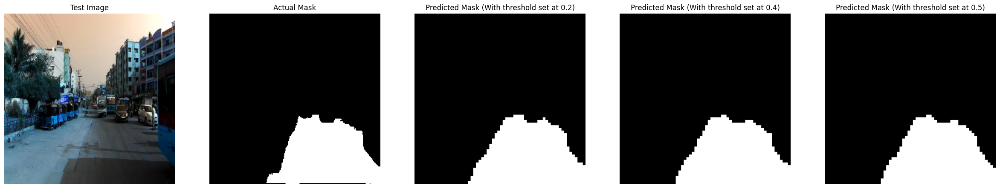

In [45]:
threshold1 = 0.2
threshold2 = 0.4
threshold3 = 0.5
predictions_trained_threshold1 = (predictions_trained > threshold1).astype(np.uint8)
predictions_trained_threshold2 = (predictions_trained > threshold2).astype(np.uint8)
predictions_trained_threshold3 = (predictions_trained > threshold3).astype(np.uint8)

import matplotlib.pyplot as plt
plt.figure(figsize=(30,24))
plt.subplot(1, 5, 1)
plt.imshow(test_images[6])
plt.title('Test Image')
plt.axis('off')

plt.subplot(1, 5, 2)
plt.imshow(test_binary_masks[6], cmap='gray')
plt.title('Actual Mask')
plt.axis('off')

plt.subplot(1, 5, 3)
plt.imshow(predictions_trained_threshold1[6], cmap='gray')
plt.title('Predicted Mask (With threshold set at {})'.format(threshold1))
plt.axis('off')

plt.subplot(1, 5, 4)
plt.imshow(predictions_trained_threshold2[6], cmap='gray')
plt.title('Predicted Mask (With threshold set at {})'.format(threshold2))
plt.axis('off')

plt.subplot(1, 5, 5)
plt.imshow(predictions_trained_threshold3[6], cmap='gray')
plt.title('Predicted Mask (With threshold set at {})'.format(threshold3))
plt.axis('off')
  # plt.show()

# plt.title('Predicted Mask (With threshold set at {})'.format(threshold))


<ipython-input-46-2c52f76b1df1>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(17,7))


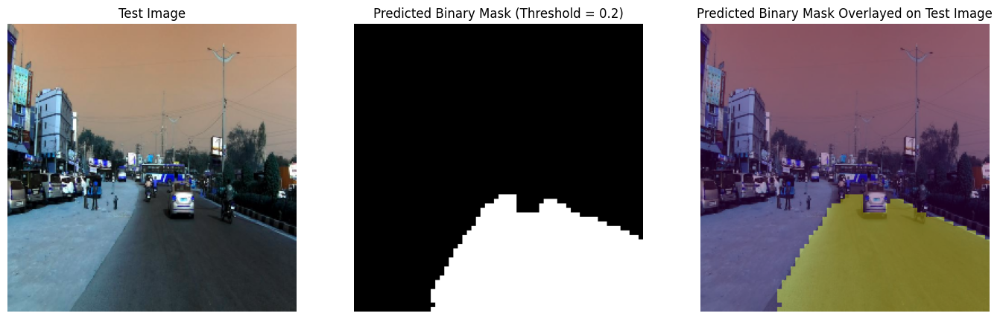

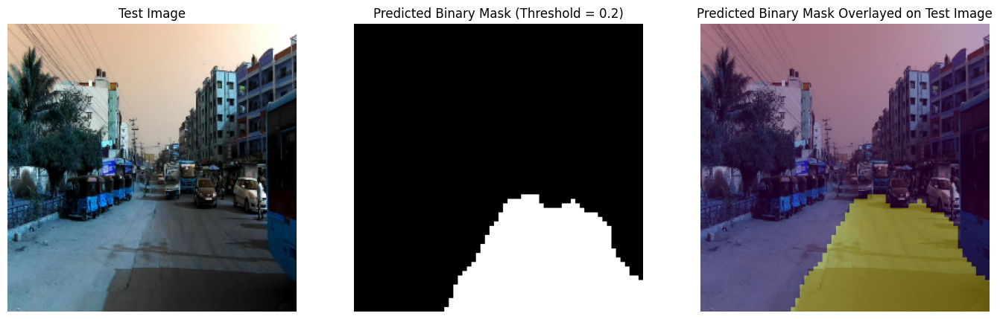

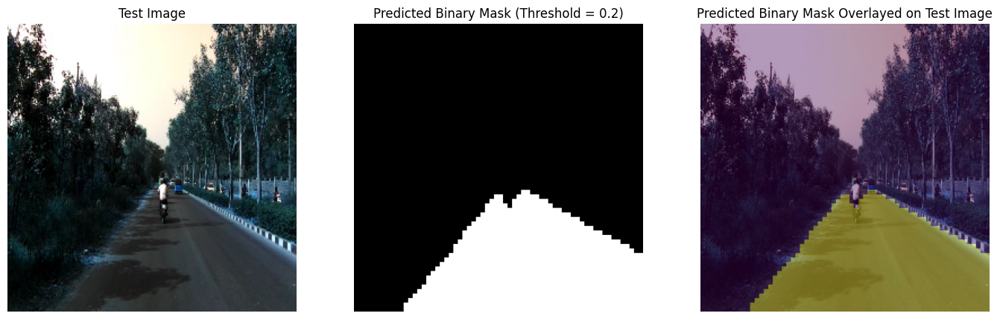

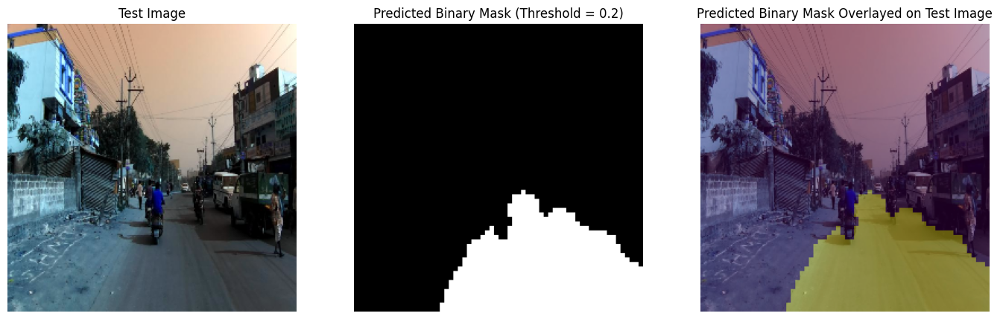

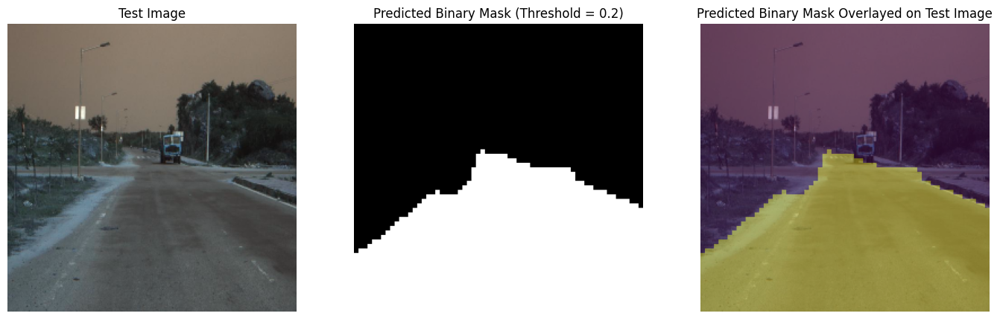

...

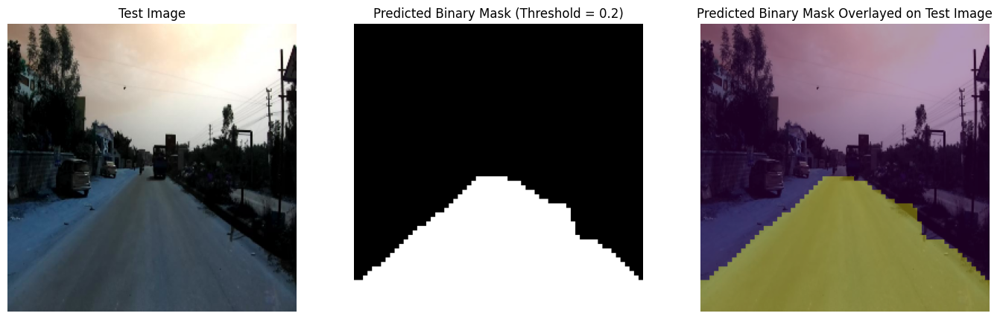

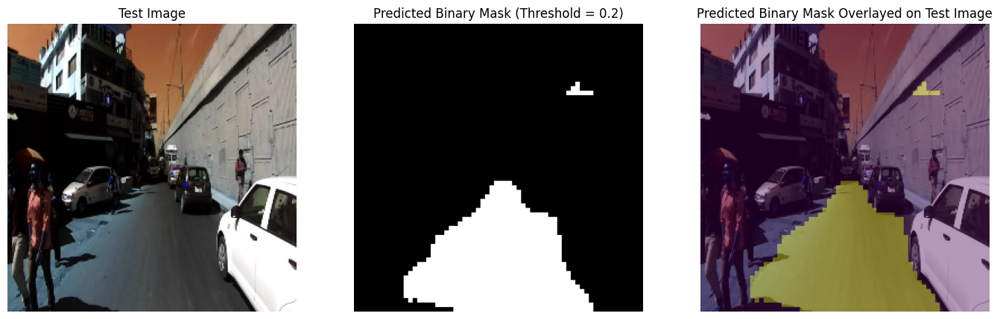

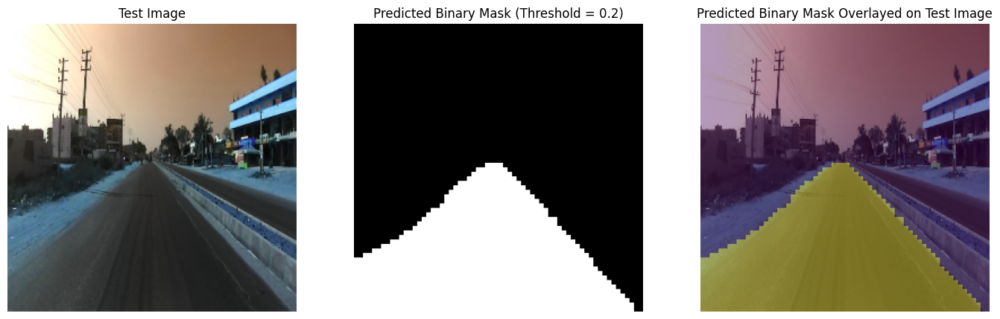

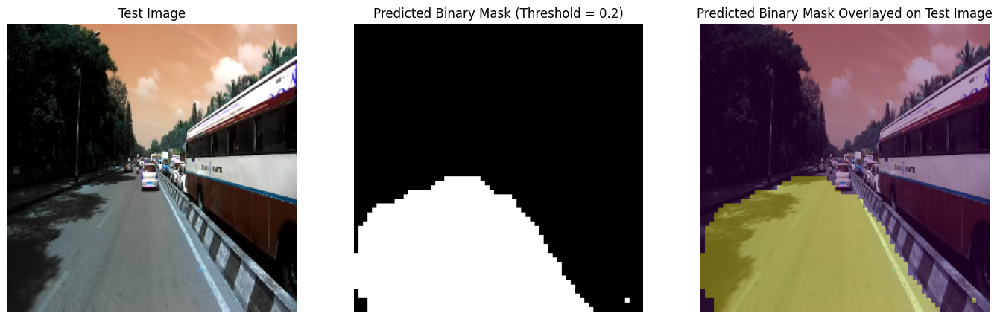

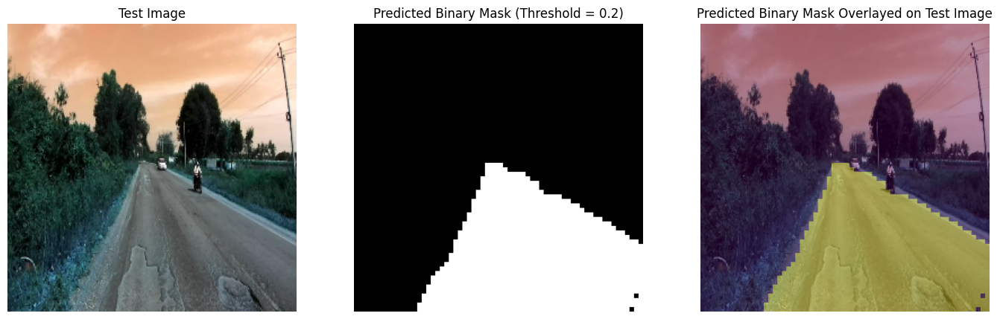

In [46]:
for index in range(28):
  if index < 5:
    continue
  plt.figure(figsize=(17,7))

  plt.subplot(1, 3, 1)
  plt.imshow(test_images[index])
  plt.title('Test Image')
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.imshow(predictions_trained_threshold1[index], cmap='gray')
  plt.title('Predicted Binary Mask (Threshold = {})'.format(threshold1))
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.imshow(predictions_trained_threshold1[index])
  plt.imshow(test_images[index] , alpha=0.6)
  plt.title('Predicted Binary Mask Overlayed on Test Image')
  plt.axis('off')

binary_accuracy
loss
val_binary_accuracy
val_loss
learning_rate


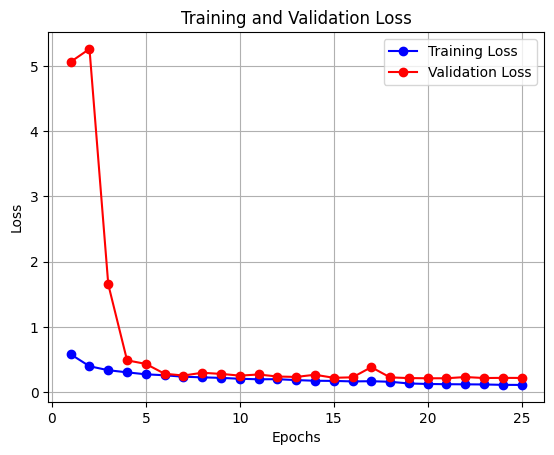

In [50]:
for key in history.history.keys():
    print(key)

# Extract the training and validation loss values
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss graphs
plt.figure()
plt.plot(range(1, len(train_loss) + 1), train_loss, marker='o', color='blue', label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, marker='o', color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()